<a href="https://colab.research.google.com/github/diegormsouza/gnc-a-caribbean/blob/main/INPE_Caribbean_General_GNC_A_Products_May_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

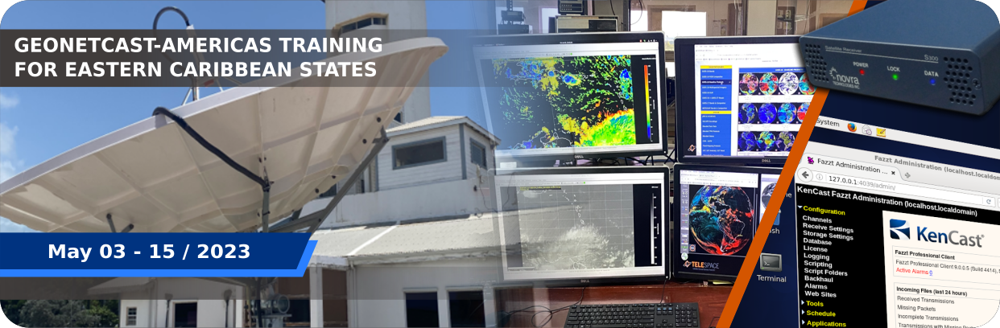

## **GENERAL GNC-A DATA PROCESSING WITH PYTHON** 
Developed by: INPE / CGCT / DISSM - Brazil

COLAB Notebook Version: May 2023

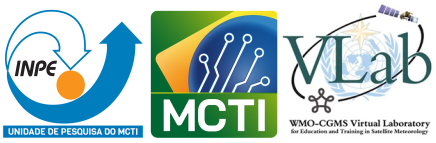

### **Contact:** Diego Souza - INPE / CGCT / DISSM - (diego.souza@inpe.br)

# **Introduction**

Welcome to the **"General GNC-A Data Processing With Python"** COLAB Notebook! 


---


This interactive "notebook" contains instructions for installing Python scripting tools for manipulating some of the data available in the GEONETCast-Americas broadcast. All instructions and scripts are executed in the cloud, and it is not necessary to install the tools and download files locally. To execute the instructions, click on the "Play" icon in square brackets at the left side of each cell, sequentially.

# **Step 1: Checking the Virtual Machine Configuration**

In this step we check the virtual machine configuration and the installed Python version.


In [ ]:
# Checking the O.S Installed
!cat /etc/issue
!uname -a
print('\n')

# Available RAM
!grep MemTotal /proc/meminfo
print('\n')

# Available HDD Space 
!df -h
print('\n')

# Python Installation Directory
!which python
print('\n')

# Python Version Installed
!python --version
print('\n')

Ubuntu 20.04.5 LTS \n \l

Linux 42e093107a0d 5.10.147+ #1 SMP Sat Dec 10 16:00:40 UTC 2022 x86_64 x86_64 x86_64 GNU/Linux


MemTotal:       13297192 kB


Filesystem      Size  Used Avail Use% Mounted on
overlay         108G   39G   70G  36% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.1G  841M  58% /usr/sbin/docker-init
tmpfs           6.4G   40K  6.4G   1% /var/colab
/dev/sda1        70G   43G   28G  61% /etc/hosts
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


/usr/local/bin/python


Python 3.9.16




# **Step 2: Installing the Required Python Libraries**

In this step we install the necessary libraries to run the scripts. Basically, the libraries will have the following purpose:

*   **pyhdf:** Read HDF Files
*   **pyproj:** Convert coordinates from epsg:4326 to epsg:3857
*   **NetCDF4:** Read NetCDF Files
*   **Cartopy:** Add Maps to the Plots

In [ ]:
# Installing the PyHDF library
!pip install pyhdf
print('\n')

# Install Pyproj ()
!pip install pyproj
print('\n')

# Installing the NetCDF4 library
!pip install netcdf4
print('\n')

# Installing the PyGRIB library
!pip install pygrib
print('\n')

# Installing the Cartopy library
!pip install cartopy
!pip install shapely --no-binary shapely --force
print('\n')

# Upgrading Numpy (required for PyHDF to work)
!pip install numpy --upgrade
print('\n')

# Restarting the Runtime programatically (needed for the numpy upgrade)
try:
  from gem.utils import graph_util, plot_util
except (ImportError, KeyError, ModuleNotFoundError):
  print('Restarting RUNTIME...')
  exit()
  print('\n')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.8/739.8 kB 21.9 MB/s eta 0:00:00


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 59.9 MB/s eta 0:00:00


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 53.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 56.5 MB/s eta 0:00:00


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 48.0 MB/s eta 0:00:00


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 72.0 MB/s eta 0:00:00
  Installing buil

# **3° Step: Downloading Samples and Ancillary Files**

In this step we will download some samples for ALPW, SST, SST Anomaly, 7-Day SST Trend, Ocean Color and ancillary files, necessary for this demonstration:

Data Samples:
*   **2021188120000_ADVECT_COMPOSITE.HDF:** ALPW HDF sample
*   **coraltemp_v3.1_20210706.nc:** SST NetCDF sample
*   **ct5km_ssta_v3.1_20210706.nc:** SST Anomaly NetCDF sample
*   **ct5km_sst-trend-7d_v3.1_20210706:** 7-Day SST Trend NetCDF sample
*   **VR1VCW_C2021187_C39_153120_165931-171344_184032-185444_202130-203418_220230-220937_VY00_edgemask_chlora.nc:** Ocean Color NetCDF sample
*   **BHP-TPW_v01r1_blend_s202304181501193_e202304190256136_c202304190320065.nc:** Blended TPW NetCDF sample
*   **BHP-RR_v01r1_blend_s202304190402052_e202304191201136_c202304191229598.nc:** Blended Rain Rate NetCDF sample
*   **VI-WKL-GLB_v2r1_j01_s20230411_e20230418_c202304190539050.nc:** Weekly NDVI NetCDF sample
*   **TOAST_Blended-grb_j01_CRIN_j01_OMPS_20230418.grb:** Total Ozone GRIB sample
*   **INPE_MVF_202304192200.tar.gz:** Multimission Fires Shapefile sample
Ancillary Files:
*   **ne_10m_admin_1_states_provinces.zip:** Shapefile with states and provinces of the world
*   **alpw_lats.txt:** Latitudes for the ALPW HDF files
*   **alpw_lons.txt:** Longitudes for the ALPW HDF files

In [ ]:
# Downloading the Shapefiles with states and provinces of the world
!wget -c https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/10m/cultural/ne_10m_admin_1_states_provinces.zip
print('\n')

# Unziping the Shapefile
!unzip -o ne_10m_admin_1_states_provinces.zip
print('\n')

# Downloading the reference file with the ALPW latitudes
!wget -c https://www.dropbox.com/s/hlf7ak948qz0b4z/alpw_lats.txt
print('\n')

# Downloading the reference file with the ALPW longitudes
!wget -c https://www.dropbox.com/s/alp5jouju290uy9/alpw_lons.txt
print('\n')

# Downloading a ALPW sample file
!wget -c https://www.dropbox.com/s/1cwz8g7dimbzzyo/2021188120000_ADVECT_COMPOSITE.HDF
print('\n')

# Downloading a SST sample file
!wget -c https://www.dropbox.com/s/4azzpqps0rk035t/coraltemp_v3.1_20210706.nc
print('\n')

# Downloading a SST Anomaly sample file
!wget -c https://www.dropbox.com/s/gijirqb2r7wi260/ct5km_ssta_v3.1_20210706.nc
print('\n')

# Downloading a 7-Day SST Trend sample file
!wget -c https://www.dropbox.com/s/1hk37ov4i5v9hve/ct5km_sst-trend-7d_v3.1_20210706.nc
print('\n')

# Downloading a Ocean Color sample file
!wget -c https://www.dropbox.com/s/qcbh3bfwv3kofrl/VR1VCW_C2021187_C39_153120_165931-171344_184032-185444_202130-203418_220230-220937_VY00_edgemask_chlora.nc
print('\n')

# Downloading a Blended TPW sample file
!wget -c https://www.dropbox.com/s/xqa99yo5bgvwxv1/BHP-TPW_v01r1_blend_s202304181501193_e202304190256136_c202304190320065.nc

# Downloading a Blended Rain Rate sample file
!wget -c https://www.dropbox.com/s/9t50hk902cx0ht2/BHP-RR_v01r1_blend_s202304190402052_e202304191201136_c202304191229598.nc

# Downloading a NDVI sample file
!wget -c https://www.dropbox.com/s/gfar20moji0db05/VI-WKL-GLB_v2r1_j01_s20230411_e20230418_c202304190539050.nc

# Downloading a Total Ozone (TOAST) sample file
!wget -c https://www.dropbox.com/s/mhpm7zdao4ggcme/TOAST_Blended-grb_j01_CRIN_j01_OMPS_20230418.grb

# Downloading a Multimission Fire / Hotspots sample file
!wget -c https://www.dropbox.com/s/d544yd5iur8u89b/INPE_MVF_202304192200.tar.gz
!gunzip INPE_MVF_202304192200.tar.gz
!tar -xvf INPE_MVF_202304192200.tar

--2023-04-22 12:41:59--  https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/10m/cultural/ne_10m_admin_1_states_provinces.zip
Resolving www.naturalearthdata.com (www.naturalearthdata.com)... 50.87.253.14
Connecting to www.naturalearthdata.com (www.naturalearthdata.com)|50.87.253.14|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://naciscdn.org/naturalearth/10m/cultural/ne_10m_admin_1_states_provinces.zip [following]
--2023-04-22 12:41:59--  https://naciscdn.org/naturalearth/10m/cultural/ne_10m_admin_1_states_provinces.zip
Resolving naciscdn.org (naciscdn.org)... 18.160.46.106, 18.160.46.70, 18.160.46.110, ...
Connecting to naciscdn.org (naciscdn.org)|18.160.46.106|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14909524 (14M) [application/zip]
Saving to: ‘ne_10m_admin_1_states_provinces.zip’

ne_10m_admin_1_stat 100%[===================>]  14.22M  83.6MB/s    in 0.2s    

2023-04-22 12:42:00

#**Demonstration 1: CIRA Advected Layered Precipitable Water (HDF)**

**GEONETCast-Americas Directory: /CIRA**

In this example, we'll see how to process the ALPW HDFs uploaded by CIRA, step by step.

## **Ex.1 (ALPW) Step 1: Importing Required Libraries and Making a Basic Plot**



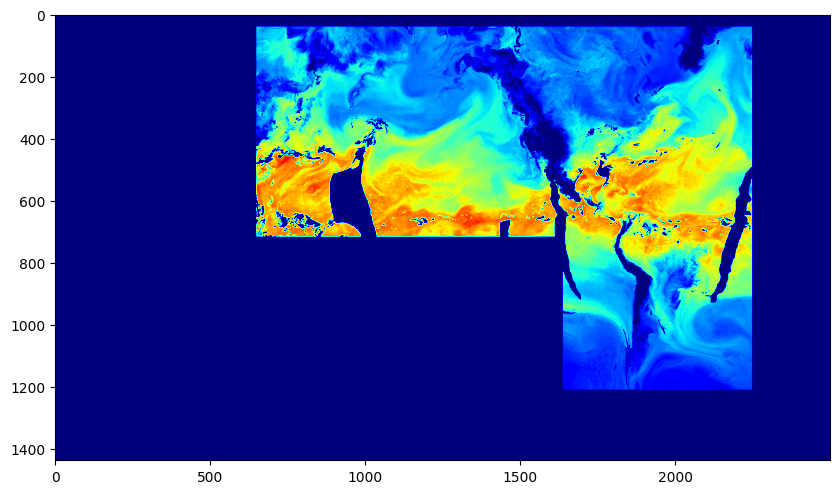

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: CIRA ALPW HDF's
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from pyhdf.SD import SD, SDC                # Import the PyHDF library
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Reading the ALPW HDF file
file = "2021188120000_ADVECT_COMPOSITE.HDF"
hdf = SD(file, SDC.READ)

# Reading the desiref dataset
# Available options: ['ALPW_1000_0850_hPa_Mean', 'ALPW_0850_0700_hPa_Mean', 'ALPW_0700_0500_hPa_Mean', 'ALPW_0500_0300_hPa_Mean']
sds_obj = hdf.select('ALPW_1000_0850_hPa_Mean') 
data = sds_obj.get() 

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.1 (ALPW) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



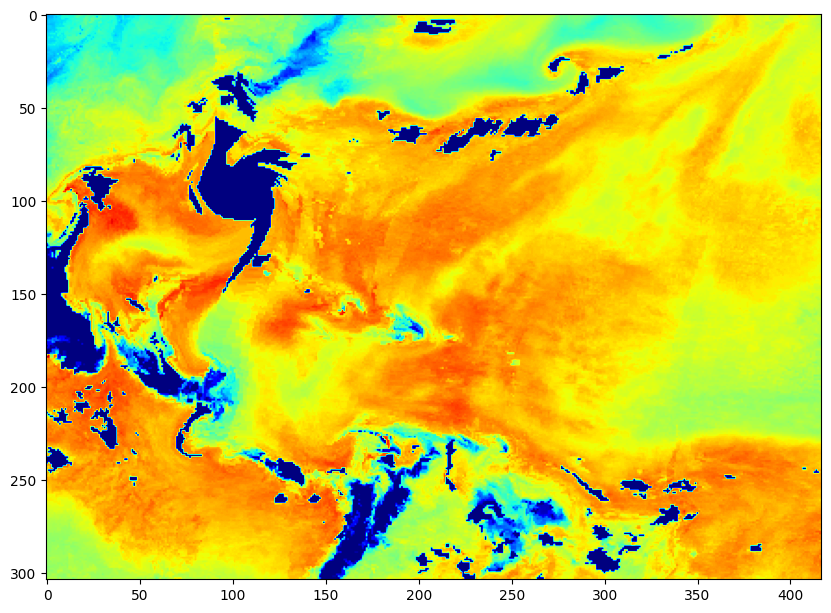

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]

# Reading the latitudes and longitudes from the reference files (provided by the ALPW developer)
lats = np.loadtxt('alpw_lats.txt')
lons = np.loadtxt('alpw_lons.txt')

# Latitude lower and upper index:
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index: 
if (extent[2] > 20):
  lonli = np.argmin( np.abs( lons - extent[0] ) )
  lonui = np.argmin( np.abs( extent[2] - lons ) )
  data1 = data[latui:latli , lonli:2499]
  data2 = data[latui:latli , 0:lonui]
  data = np.hstack((data1, data2))
else:
  lonli = np.argmin( np.abs( lons - extent[0] ) )
  lonui = np.argmin( np.abs( lons - extent[2] ) )
  data = data[latui:latli , lonli:lonui]

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.1 (ALPW) Step 3: Convert the Desired Extent (degrees) to Mercator (m) With PyProj**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Converting the extents from epsg:4326 to epsg:3857
import pyproj

proj = pyproj.Transformer.from_crs(4326, 3857, always_xy=True)
x1,y1 = (extent[0], extent[1])
x2,y2 = (extent[2], extent[3])
a, b = proj.transform(x1, y1)
c, d = proj.transform(x2, y2)
extent_mercator = [a,b,c,d]

print("Extent converted to Mercator (m): ", extent_mercator)

#------------------------------------------------------------------------------------------------------

Extent converted to Mercator (m):  [-11131949.079327356, 0.0, -4452779.631730943, 4865942.279503175]


## **Ex.1 (ALPW) Step 4: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Reading the time and date from the file name
date = file[0:13]
year = date[0:4]; jday = date[4:7]; hour = date[7:9]; minute = date[9:11]; seconds = date[11:13]

# Formatting the date
date_formatted = (datetime.strptime(year + jday, '%Y%j').date().strftime('%Y-%m-%d')) + ' ' +  hour + ':' + minute + ':' + seconds + ' UTC'

# Print the formatted time and date
print("ALPW File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

ALPW File Date:  2021-07-07 12:00:00 UTC


## **Ex.1 (ALPW) Step 5: Final Plot**



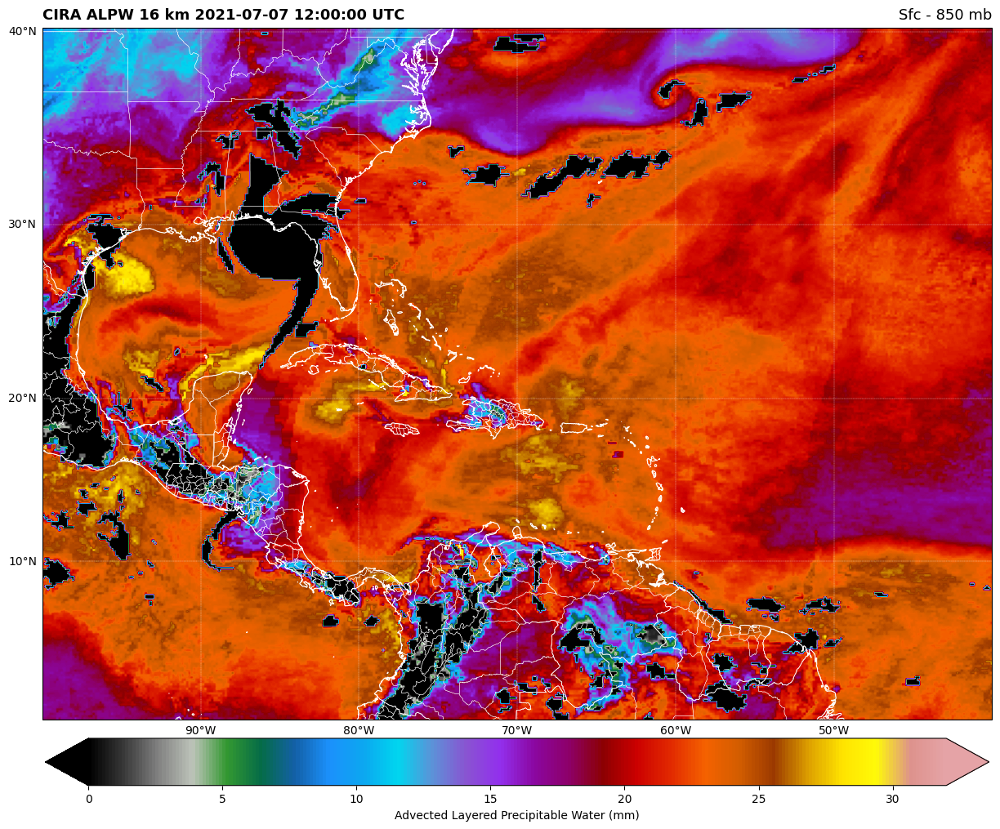

In [ ]:
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.Mercator())

# Define the image extent
img_extent = [extent_mercator[0], extent_mercator[2], extent_mercator[1], extent_mercator[3]]

# Create a custom color scale based in the ALPW web page (http://cat.cira.colostate.edu/sport/layered/advected/LPW_SAm.htm)
colors = ["#000000", "#393939", "#818181", "#bec4ba", "#339831", "#056c47", 
          "#1360a7", "#1b91fc", "#0ca7f0", "#00d6ef", "#5c92d8", "#8954d1", 
          "#922fed", "#8b07a0", "#8d0069", "#8c0002", "#cc0000", "#e22a00", 
          "#f56200", "#d25d00", "#9b3900", "#dc9e00", "#ffe300", "#fffa08", 
          "#dd928c", "#e5a3a6"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
vmin = 0
vmax = 32
    
# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Advected Layered Precipitable Water (mm)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('CIRA ALPW 16 km ' + date_formatted, fontweight='bold', fontsize=13, loc='left')
plt.title('Sfc - 850 mb', fontsize=13, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

# **Demonstration 2: NOAA Coral Reef Watch 5 km SST (NetCDF)** 

**GEONETCast-Americas Directory: /NOAA-NESDIS**

In this example, we'll see how to process the SST NetCDFs uploaded by NOAA, step by step.

## **Ex.2 (SST) Step 1: Importing Required Libraries and Making a Basic Plot**



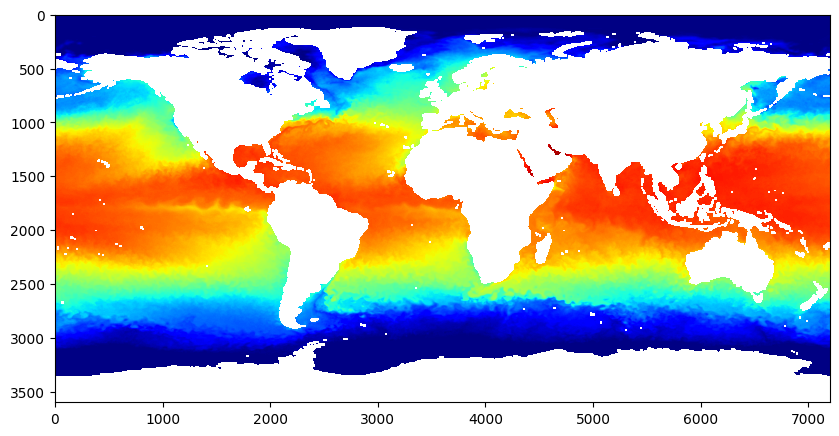

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: NOAA Coral Reef Watch 5 km SST - NetCDF
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
file = Dataset("coraltemp_v3.1_20210706.nc")

# Extract the Sea Surface Temperature
data = file.variables['analysed_sst'][:]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.2 (SST) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



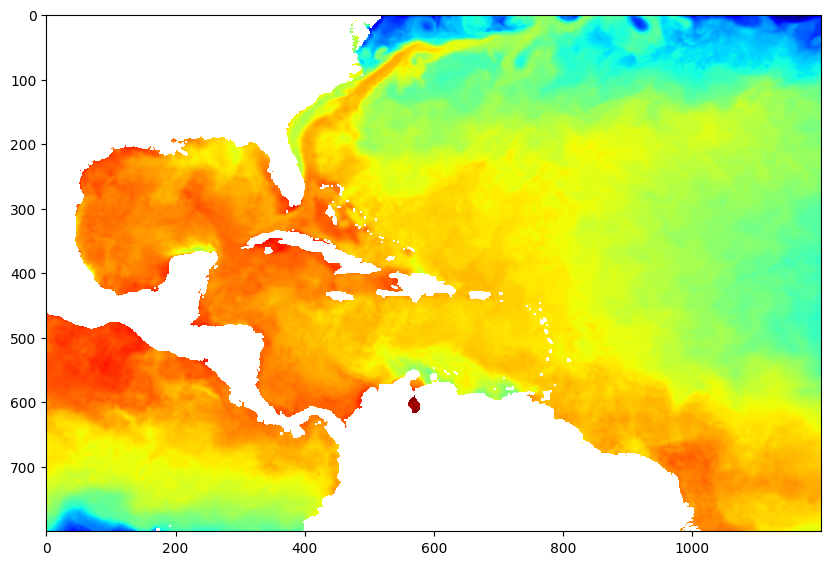

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]
       
# Reading lats and lons 
lats = file.variables['lat'][:]
lons = file.variables['lon'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the Sea Surface Temperature
data = file.variables['analysed_sst'][ : , latli:latui , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.2 (SST) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
add_seconds = int(file.variables['time'][0])
date = datetime(1981,1,1,12) + timedelta(seconds=add_seconds)
date_formatted = date.strftime('%Y-%m-%d')

# Print the formatted time and date
print("SST File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

SST File Date:  2021-07-07


## **Ex.2 (SST) Step 4: Final Plot**



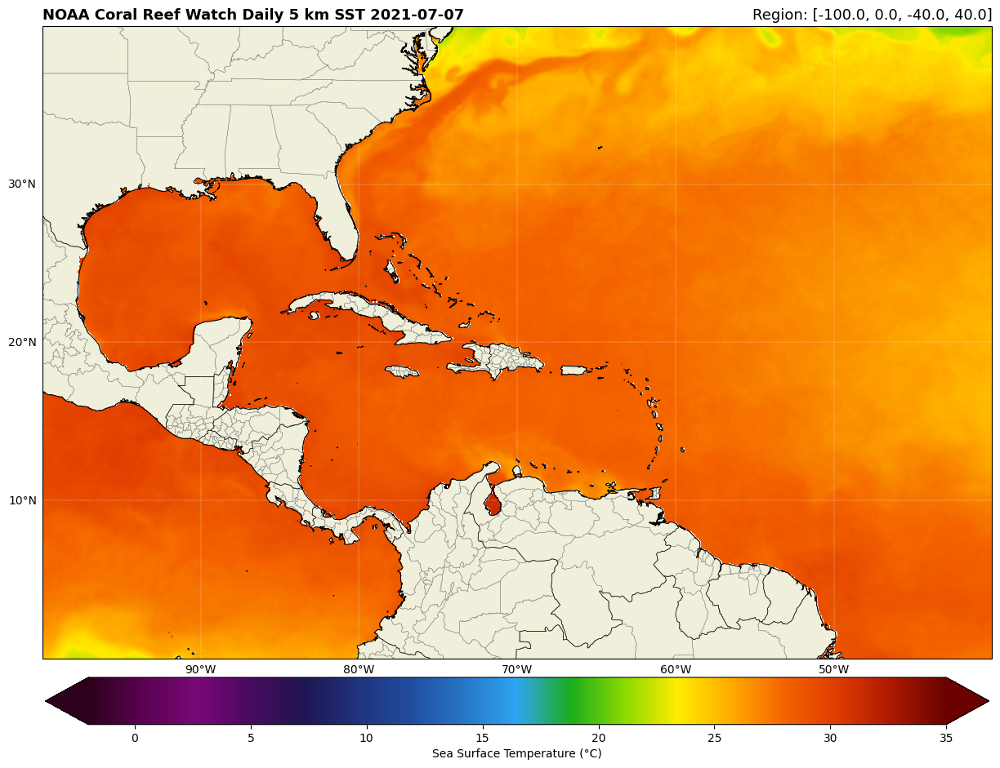

In [ ]:
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#2d001c", "#5b0351", "#780777", "#480a5e", "#1e1552", "#1f337d", 
          "#214c9f", "#2776c6", "#2fa5f1", "#1bad1d", "#8ad900", "#ffec00", 
          "#ffab00", "#f46300", "#de3b00", "#ab1900", "#6b0200"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#6b0200')
cmap.set_under('#2d001c')
vmin = -2.0
vmax = 35.0

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Sea Surface Temperature (°C)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('NOAA Coral Reef Watch Daily 5 km SST ' + date_formatted, fontweight='bold', fontsize=13, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

# **Demonstration 3: NOAA Coral Reef Watch 5 km SST Anomaly (NetCDF)** 

**GEONETCast-Americas Directory: /NOAA-NESDIS**

In this example, we'll see how to process the SST Anomaly NetCDFs uploaded by NOAA, step by step.

## **Ex.3 (SST Anomaly) Step 1: Importing Required Libraries and Making a Basic Plot**



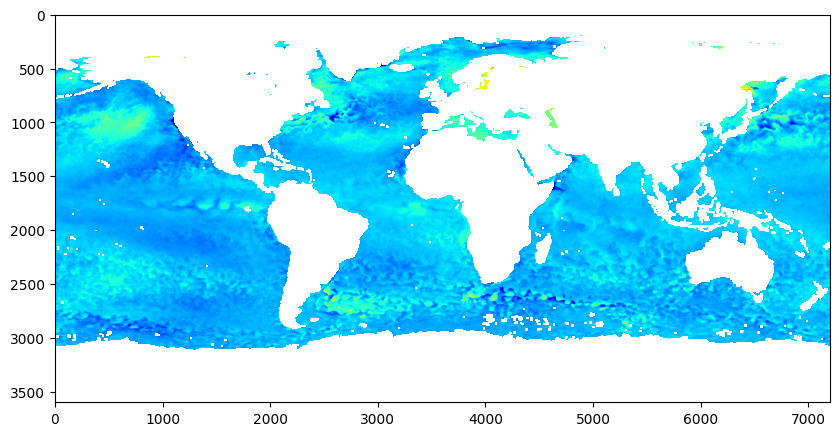

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: NOAA Coral Reef Watch 5 km SSTA - NetCDF
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
file = Dataset("ct5km_ssta_v3.1_20210706.nc")

# Extract the SST Anomaly
data = file.variables['sea_surface_temperature_anomaly'][:]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.3 (SST Anomaly) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



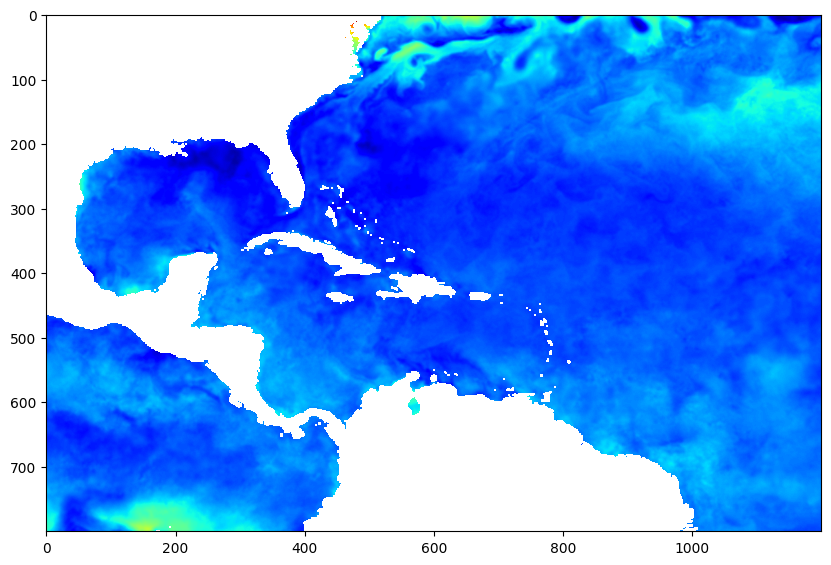

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]
       
# Reading lats and lons 
lats = file.variables['lat'][:]
lons = file.variables['lon'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the SST Anomaly
data = file.variables['sea_surface_temperature_anomaly'][ : , latui:latli , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()


## **Ex.3 (SST Anomaly) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
add_seconds = int(file.variables['time'][0])
date = datetime(1981,1,1,12) + timedelta(seconds=add_seconds)
date_formatted = date.strftime('%Y-%m-%d')

# Print the formatted time and date
print("SST Anomaly File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

SST Anomaly File Date:  2021-07-07


## **Ex.3 (SST Anomaly) Step 4: Final Plot**



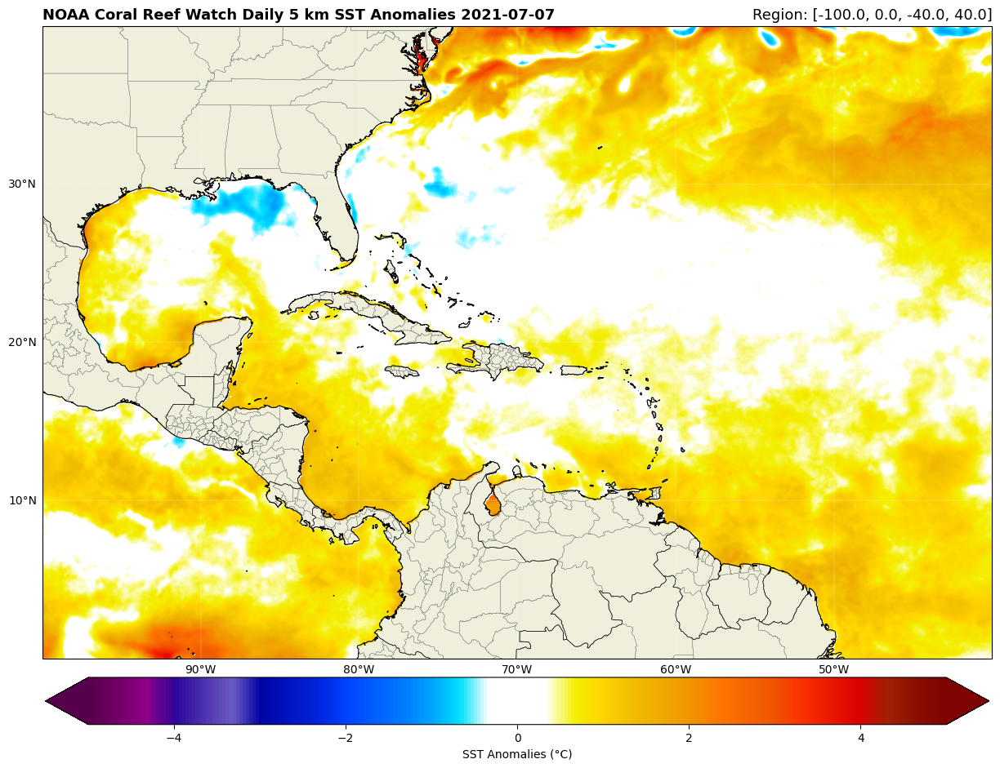

In [ ]:
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#57004d", "#730069", "#910087", "#2c0699", "#4d32af", 
          "#6b5ac3", "#0004a4", "#0014c0", "#0024dc", "#0043ff",
          "#005fff", "#007bff", "#00a5ff", "#00e1ff", "#ffffff", 
          "#ffffff", "#ffffff", "#f3f000", "#ffd200", "#f0be00",
          "#f0aa00", "#f09600", "#fd7800", "#f56400", "#ef5500", 
          "#fb3000", "#eb1800", "#db0000", "#a02000", "#8a0f00", 
          "#7d0400"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#7d0400')
cmap.set_under('#57004d')
vmin = -5.0
vmax = 5.0

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='SST Anomalies (°C)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('NOAA Coral Reef Watch Daily 5 km SST Anomalies ' + date_formatted, fontweight='bold', fontsize=13, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

# **Demonstration 4: NOAA Coral Reef Watch 5 km 7-Day SST Trend (NetCDF)**

**GEONETCast-Americas Directory: /NOAA-NESDIS**

In this example, we'll see how to process the 7-Day SST Trend NetCDFs uploaded by NOAA, step by step.

## **Ex.4 (7-Day SST Trend) Step 1: Importing Required Libraries and Making a Basic Plot**



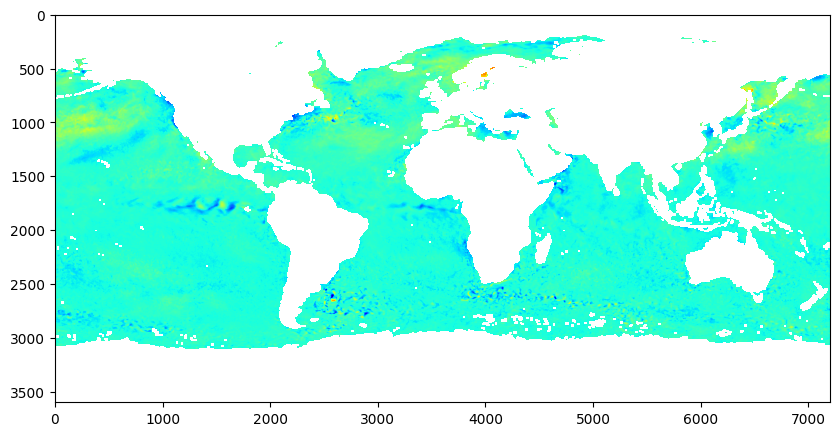

In [ ]:
#----------------------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: NOAA Coral Reef Watch 5 km 7-Day SST Trend - NetCDF
# Author: Diego Souza (INPE)
#----------------------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
file = Dataset("ct5km_sst-trend-7d_v3.1_20210706.nc")

# Extract the 7-Day SST Trend
data = file.variables['trend'][:]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.4 (7-Day SST Trend) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



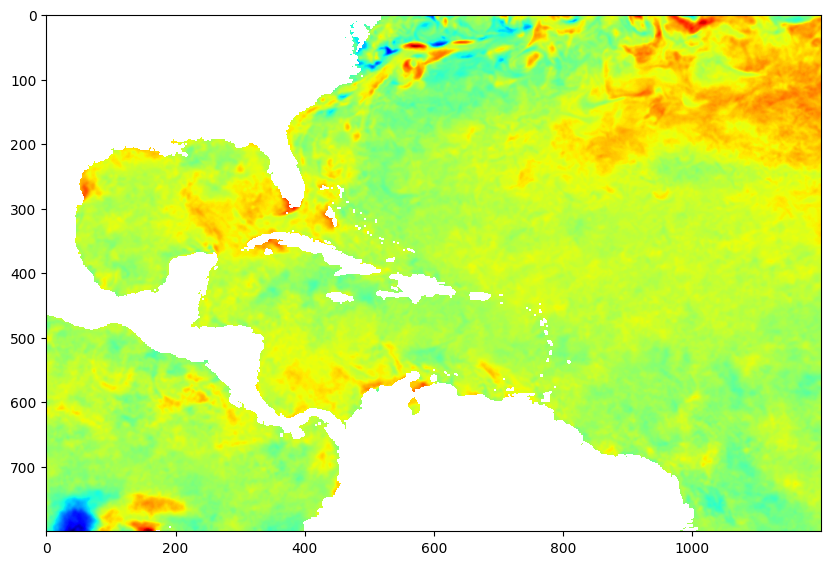

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]
       
# Reading lats and lons 
lats = file.variables['lat'][:]
lons = file.variables['lon'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the 7-Day SST Trend
data = file.variables['trend'][ : , latui:latli , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.4 (7-Day SST Trend) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
add_seconds = int(file.variables['time'][0])
date = datetime(1981,1,1,12) + timedelta(seconds=add_seconds)
date_formatted = date.strftime('%Y-%m-%d')

# Print the formatted time and date
print("7-Day SST Trend File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

7-Day SST Trend File Date:  2021-07-07


## **Ex.4 (7-Day SST Trend) Step 4: Final Plot**



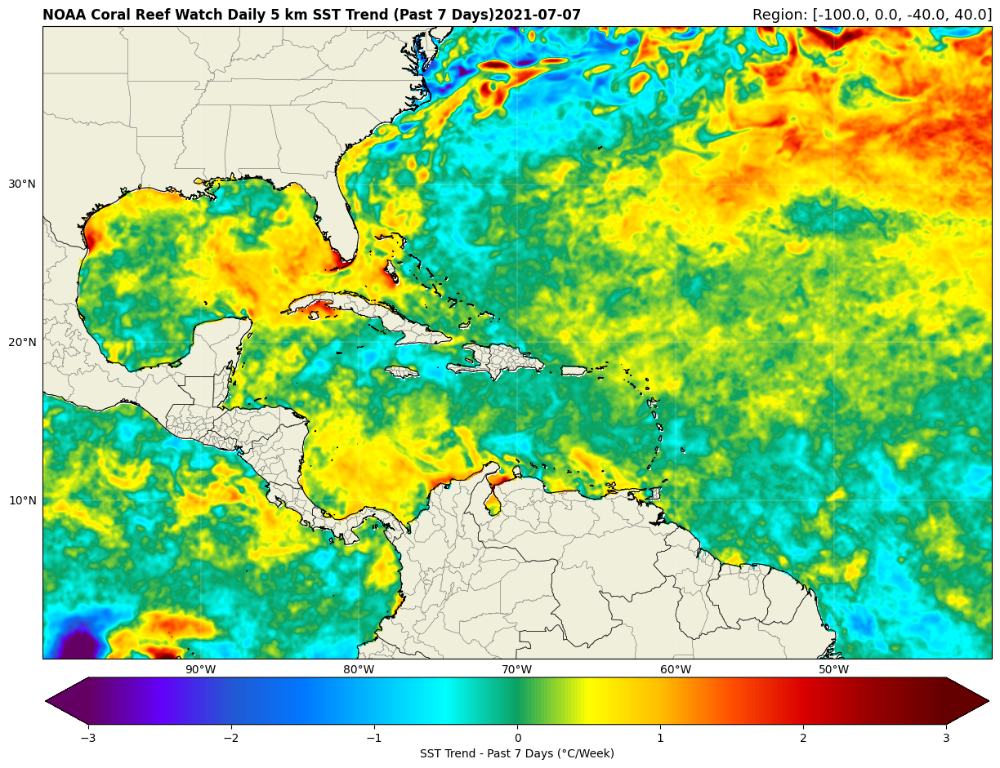

In [ ]:
#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#640064", "#6300f9", "#2259d3", "#0078ff", "#00bdfe", "#00ffff", 
          "#0ba062", "#ffff00", "#ffbe00", "#ff5000", "#db0000", "#950000", 
          "#640000"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#640000')
cmap.set_under('#640064')
vmin = -3.0
vmax = 3.0

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='SST Trend - Past 7 Days (°C/Week)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('NOAA Coral Reef Watch Daily 5 km SST Trend (Past 7 Days)' + date_formatted, fontweight='bold', fontsize=12, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

# **Demonstration 5: Ocean Color - Chlorophyll-A Concentration (NetCDF)** 

**GEONETCast-Americas Directory: JPSS/PRODUCTS/OC/**

In this example, we'll see how to process the Ocean Color NetCDFs uploaded by NOAA, step by step.

## **Ex.5 (Ocean Color) Step 1: Importing Required Libraries and Making a Basic Plot**



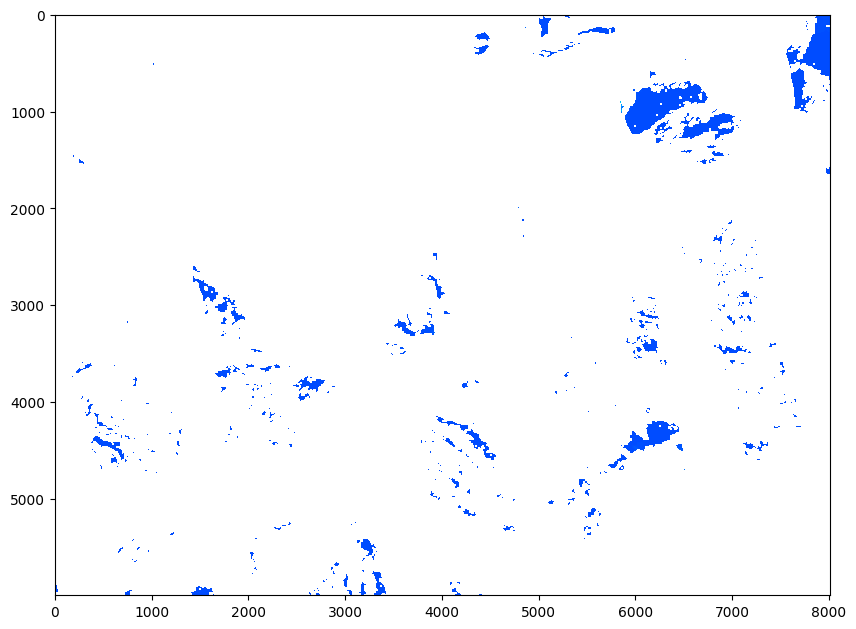

In [ ]:
#----------------------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: NOAA Ocean Color - NetCDF
# Author: Diego Souza (INPE)
#----------------------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
file = Dataset("VR1VCW_C2021187_C39_153120_165931-171344_184032-185444_202130-203418_220230-220937_VY00_edgemask_chlora.nc")

# Extract the Ocean Color
data = file.variables['chlor_a'][:]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.5 (Ocean Color) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



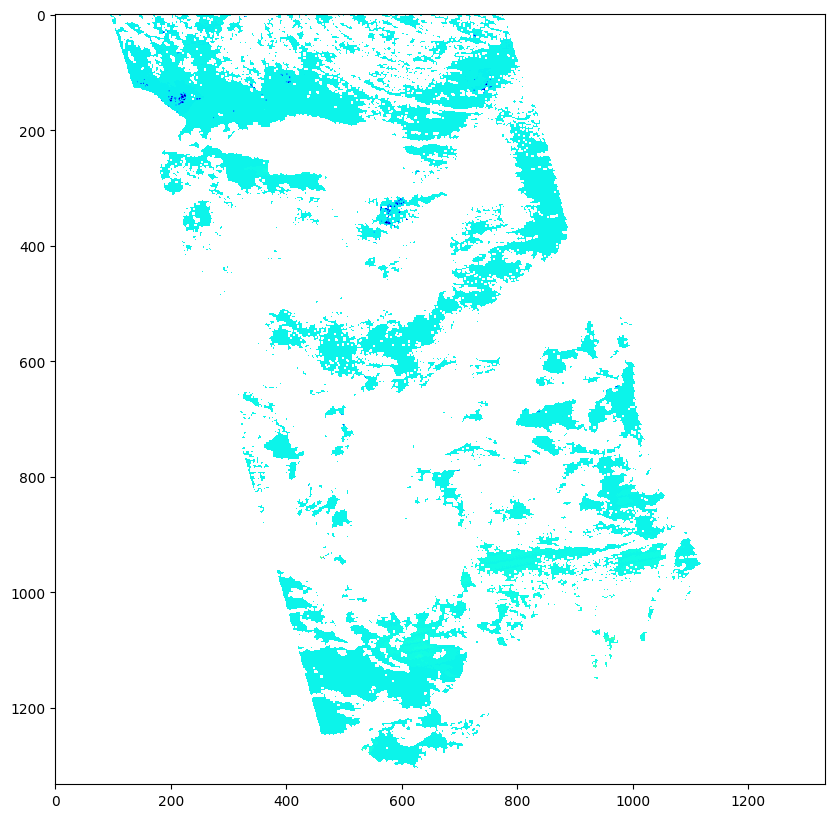

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
#extent = [-120.0, 0.0, -60.0, 44.0] # Full Eastern Caribbean Region (VY)
extent = [-70.0, 10.0, -60.0, 20.0] # Subregion of the Full Eastern Caribbean Region (WY)

# Reading lats and lons 
lats = file.variables['rows'][:]
lons = file.variables['cols'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the Ocean Color
data = file.variables['chlor_a'][ : , : , latui:latli , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()


## **Ex.5 (Ocean Color) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
add_seconds = int(file.variables['time'][0])
date = datetime(1970,1,1,12) + timedelta(seconds=add_seconds)
date_formatted = date.strftime('%Y-%m-%d')

# Print the formatted time and date
print("Ocean Color File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

Ocean Color File Date:  2021-07-07


## **Ex.5 (Ocean Color) Step 4: Final Plot**



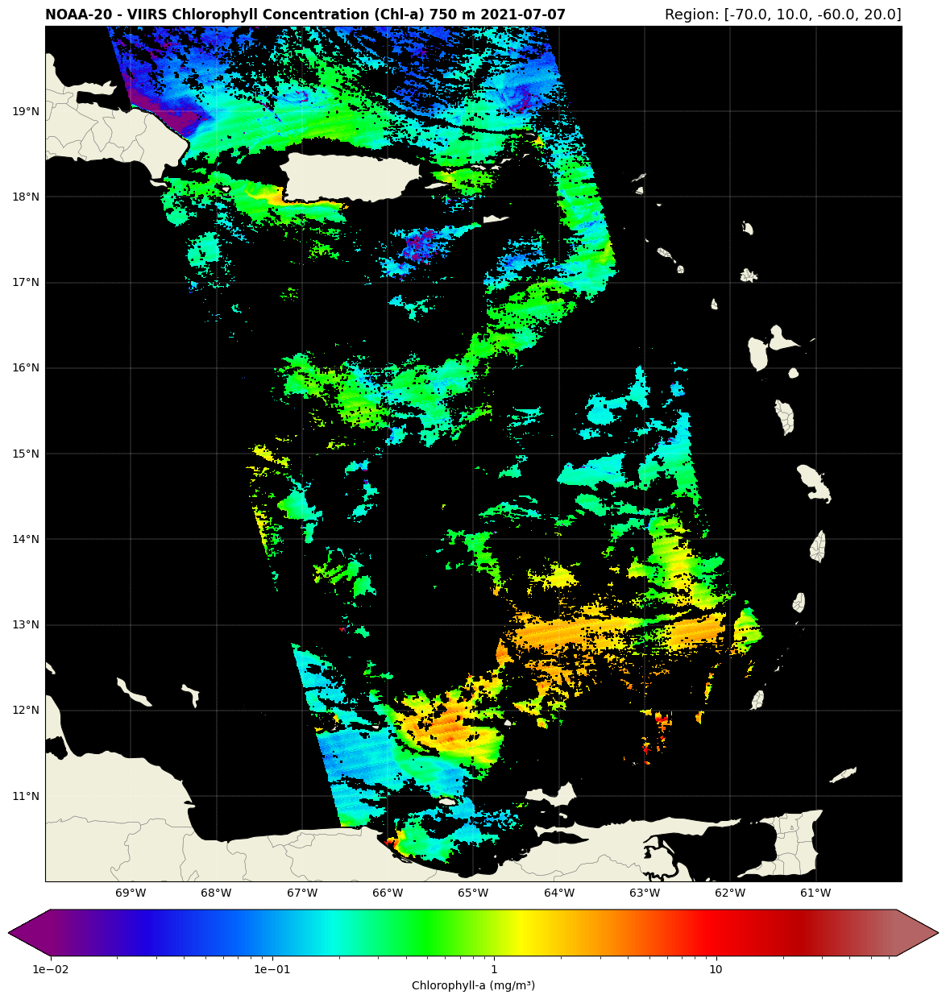

In [ ]:
#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#84007c", "#1d00e1", "#0066ff", "#00ffe7", "#00ff00", "#ffff00", 
          "#ff8a00", "#ff0000", "#bb0000", "#b46464"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#b46464')
cmap.set_under('#84007c')
vmin = 0.01
vmax = 65.00
    
# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN, facecolor='black')

# Plot the image
from matplotlib import colors, cm
norm = colors.LogNorm(vmin, vmax, clip='False')
img = ax.imshow(data, norm=norm,origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 1), ylocs=np.arange(-90, 90, 1), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
from matplotlib.ticker import LogFormatter
formatter = LogFormatter(10, labelOnlyBase=False) 
plt.colorbar(img, label='Chlorophyll-a (mg/m³)', extend='both', orientation='horizontal', pad=0.03, fraction=0.05, format=formatter)

# Add a title
plt.title('NOAA-20 - VIIRS Chlorophyll Concentration (Chl-a) 750 m ' + date_formatted, fontweight='bold', fontsize=12, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

#**Demonstration 6: Blended TPW**

**GEONETCast-Americas Directory: JPSS/PRODUCTS/BTPW/**

In this example, we'll see how to process the Multimission Blended Total Precipitable Water NetCDFs uploaded by NOAA, step by step.

## **Ex.6 (Blended TPW) Step 1: Importing Required Libraries and Making a Basic Plot**



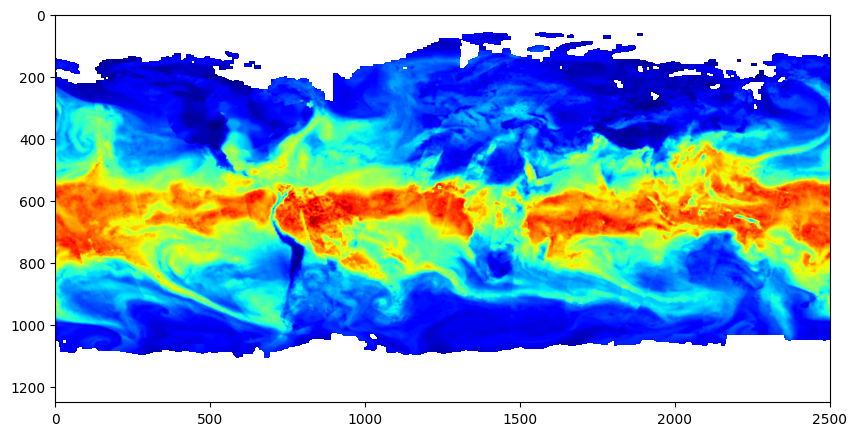

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: Blended TPW - NetCDF
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
name = "BHP-TPW_v01r1_blend_s202304181501193_e202304190256136_c202304190320065.nc"
file = Dataset(name)

# Extract the Blended TPW
data = file.variables['TPW'][:]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.6 (Blended TPW) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



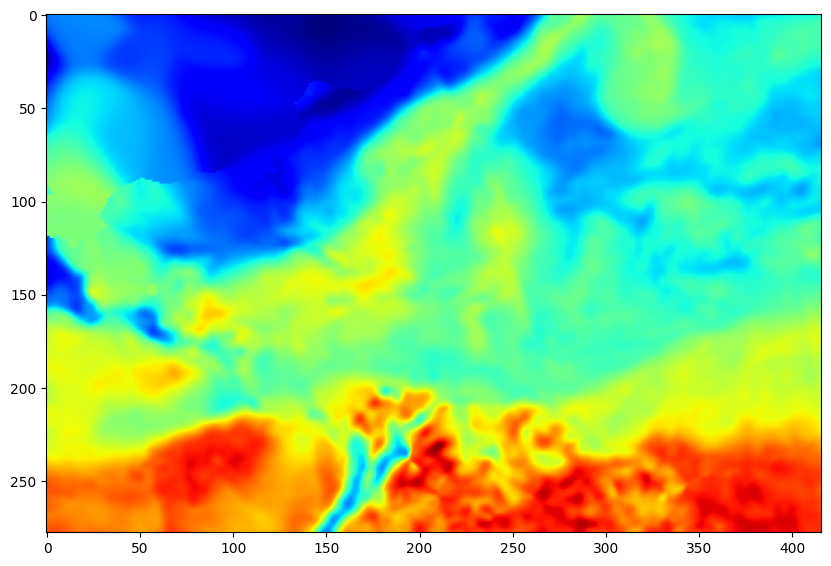

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]
       
# Reading lats and lons 
lats = file.variables['lat'][:]
lons = file.variables['lon'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the Sea Surface Temperature
data = file.variables['TPW'][ latli:latui , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.6 (Blended TPW) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
date = (name[name.find("_c")+2:name.find(".nc")])
date_file = date
date_formatted = date[0:4] + "-" + date[4:6] + "-" + date[6:8] + " " + date [8:10] + ":" + date [10:12] + " UTC"

# Print the formatted time and date
print("BTPW File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

BTPW File Date:  2023-04-19 03:20 UTC


## **Ex.6 (BTPW) Step 4: Final Plot**



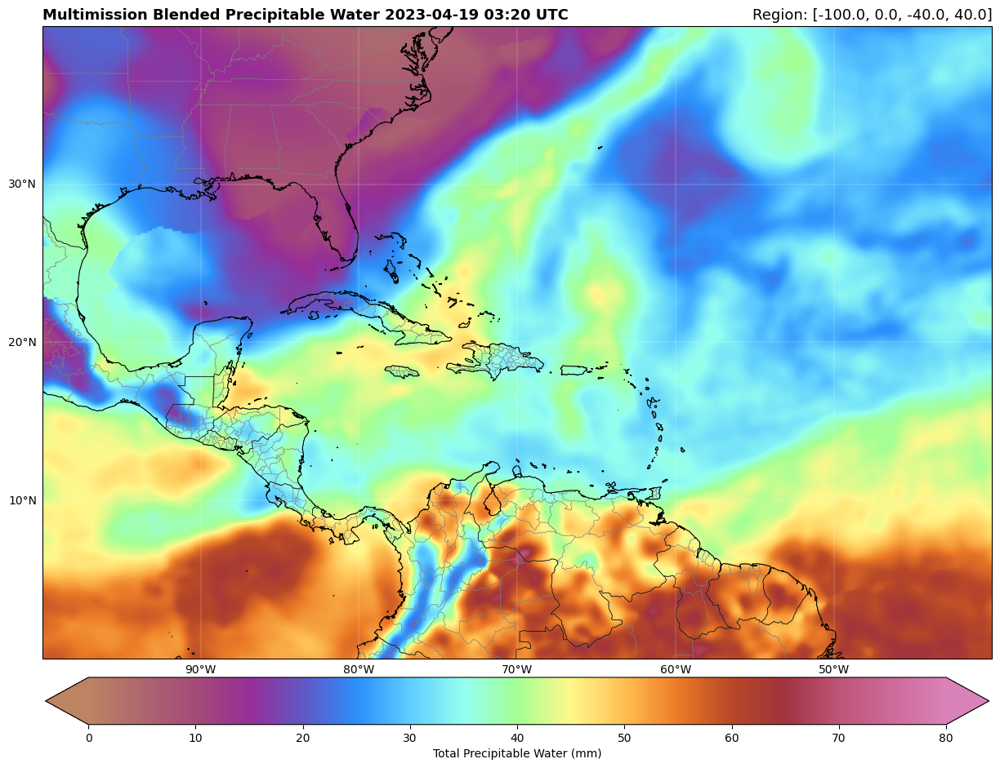

In [ ]:
#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#bc8462", "#ae656f", "#a44a79", "#962e97", "#6158c5", 
          "#2b8ffb", "#5fcdff", "#94fff0", "#a5ff94", "#fff88c",
          "#ffbf52", "#ec7b27", "#b84827", "#a1333d", "#bd5478", 
          "#cc6a99", "#d982b8"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
#cmap.set_over('#3c0000')
#cmap.set_under('#28000a')
vmin = 0
vmax = 80

# Add some various map elements to the plot to make it recognizable.
#ax.add_feature(cfeature.LAND)

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Total Precipitable Water (mm)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('Multimission Blended Precipitable Water ' + date_formatted, fontweight='bold', fontsize=13, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')
#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

#**Demonstration 7: Blended Rain Rate**

**GEONETCast-Americas Directory: JPSS/PRODUCTS/BTPW/**

In this example, we'll see how to process the Multimission Blended Rain Rate NetCDFs uploaded by NOAA, step by step.

## **Ex.7 (Blended Rain Rate) Step 1: Importing Required Libraries and Making a Basic Plot**



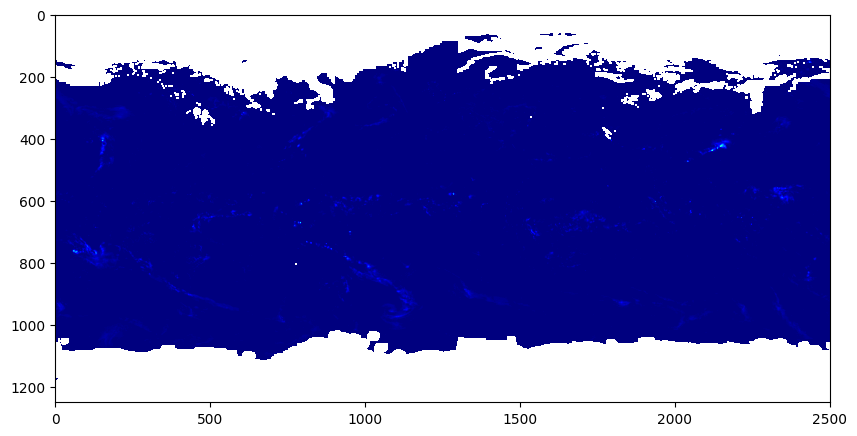

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: Blended Rain Rate - NetCDF
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
name = "BHP-RR_v01r1_blend_s202304190402052_e202304191201136_c202304191229598.nc"
file = Dataset(name)

# Extract the Blended TPW
data = file.variables['RR'][:]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.7 (Blended TPW) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



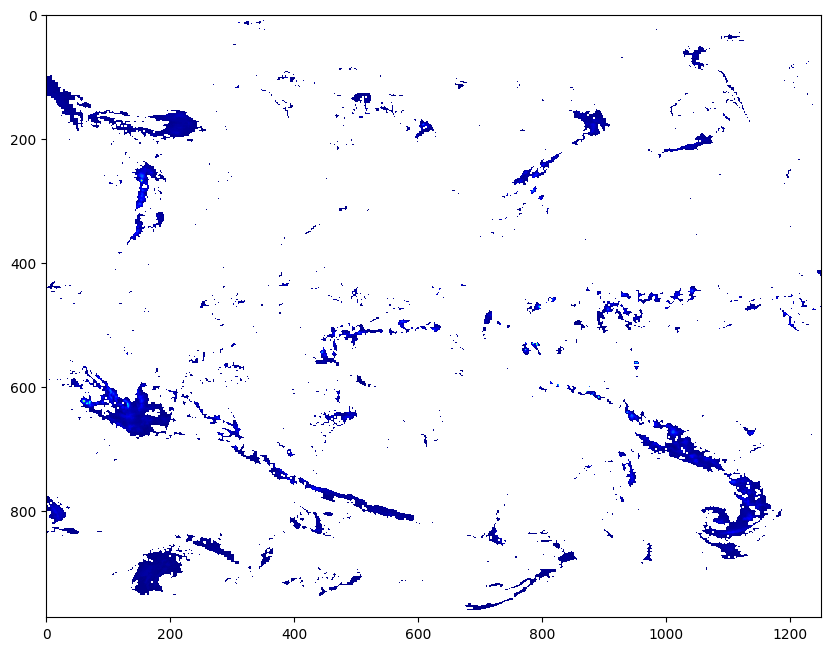

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-180.0, -70.00, 0.00, 70.00]
       
# Reading lats and lons 
lats = file.variables['lat'][:]
lons = file.variables['lon'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the Sea Surface Temperature
data = file.variables['RR'][ latli:latui , lonli:lonui ]

# Return a reshaped matrix
data = data.squeeze()

# Flip the y axis
data = np.flipud(data)

# Null values as NaN
data[data == 0] = np.nan
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.7 (Blended TPW) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
date = (name[name.find("_c")+2:name.find(".nc")])
date_file = date
date_formatted = date[0:4] + "-" + date[4:6] + "-" + date[6:8] + " " + date [8:10] + ":" + date [10:12] + " UTC"

# Print the formatted time and date
print("Rain Rate File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

Rain Rate File Date:  2023-04-19 12:29 UTC


## **Ex.7 (BTPW) Step 4: Final Plot**



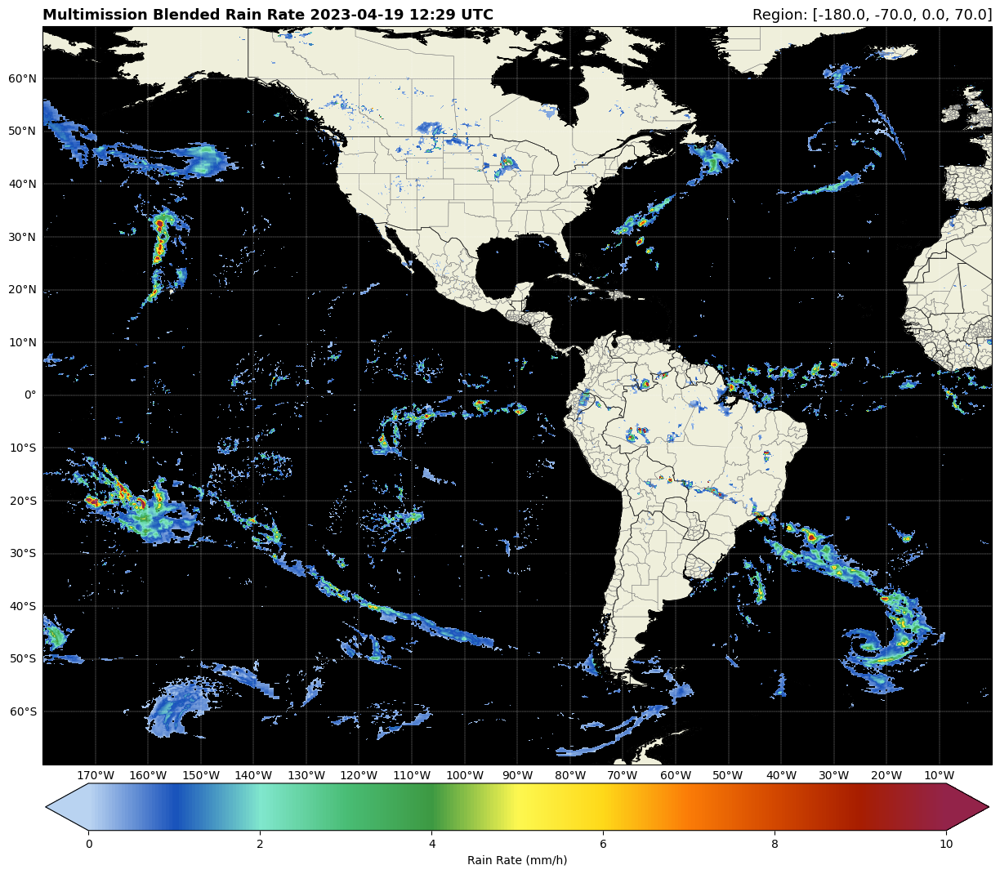

In [ ]:
#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#b9d3f1", "#1751bb", "#80e7cd", "#49bd75", "#3d9942", 
        "#fdf850", "#fed919", "#fb7c07", "#d34800", "#a71d00", 
        "#932349"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_under('#b9d3f1')
cmap.set_over('#932349')
vmin = 0
vmax = 10

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN, facecolor='black')

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Rain Rate (mm/h)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('Multimission Blended Rain Rate ' + date_formatted, fontweight='bold', fontsize=13, loc='left')
plt.title('Region: ' + str(extent), fontsize=13, loc='right')
#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

#**Demonstration 8: Normalized Difference Vegetation Index**

**GEONETCast-Americas Directory: JPSS/PRODUCTS/VEGETATION/**

In this example, we'll see how to process the NDVI NetCDFs uploaded by NOAA, step by step.

## **Ex.8 (NDVI) Step 1: Importing Required Libraries and Making a Basic Plot**



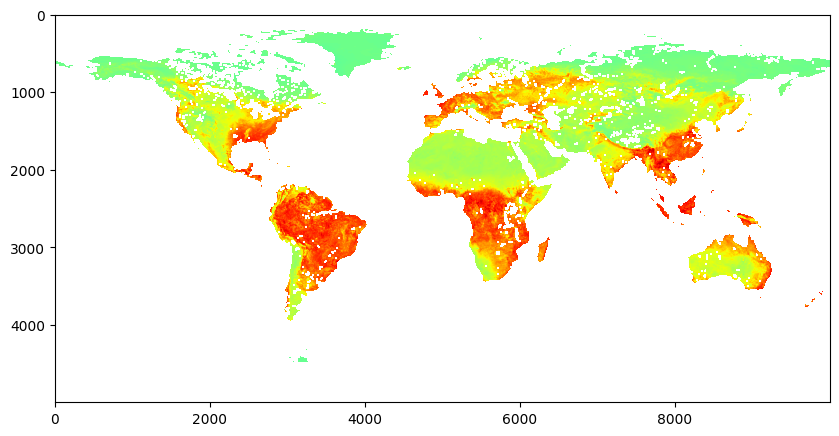

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: Blended TPW - NetCDF
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the NetCDF4 library
name = "VI-WKL-GLB_v2r1_j01_s20230411_e20230418_c202304190539050.nc"
file = Dataset(name)

# Extract the NDVI
data = file.variables['NDVI_TOC'][:]

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.8 (NDVI) Step 2: Retrieving Pixels for a Specific Region (Min. lon, Min. lat, Max. lon, Max. lat)**



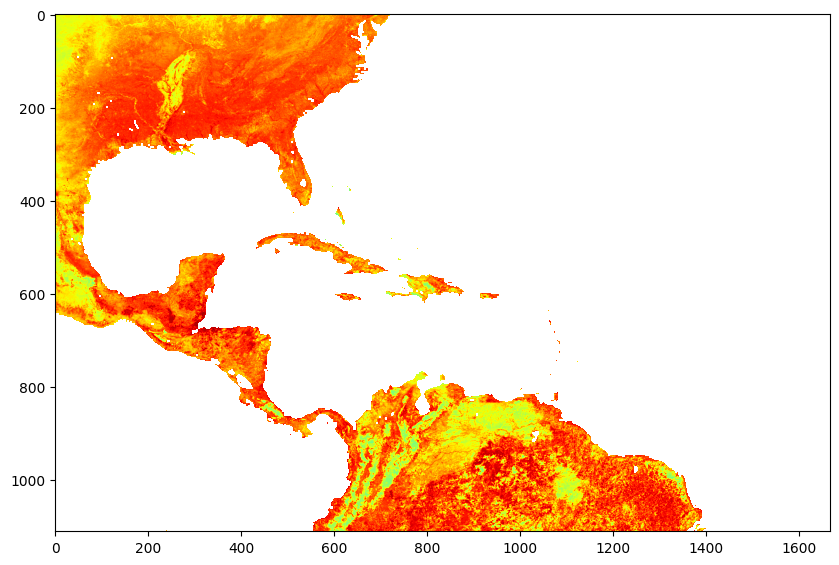

In [ ]:
#------------------------------------------------------------------------------------------------------

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-100.0, 0.00, -40.00, 40.00]
       
# Reading lats and lons 
lats = file.variables['latitude'][:]
lons = file.variables['longitude'][:]
 
# Latitude lower and upper index
latli = np.argmin( np.abs( lats - extent[1] ) )
latui = np.argmin( np.abs( lats - extent[3] ) )
 
# Longitude lower and upper index
lonli = np.argmin( np.abs( lons - extent[0] ) )
lonui = np.argmin( np.abs( lons - extent[2] ) )
 
# Extract the Sea Surface Temperature
data = file.variables['NDVI_TOC'][ latui:latli , lonli:lonui ]

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Plot the image
plt.imshow(data, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.8 (NDVI) Step 3: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
start = (name[name.find("_s")+2:name.find("_e")])
end = (name[name.find("_e")+2:name.find("_c")])
date_formatted = start[0:4] + '-' + start[4:6] + '-' + start[6:8] + ' to ' + end[0:4] + '-' + end[4:6] + '-' + end[6:8]
date_file = end[0:4] + end[4:6] + end[6:8]

# Print the formatted time and date
print("NDVI File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

NDVI File Date:  2023-04-11 to 2023-04-18


## **Ex.8 (NDVI) Step 4: Final Plot**



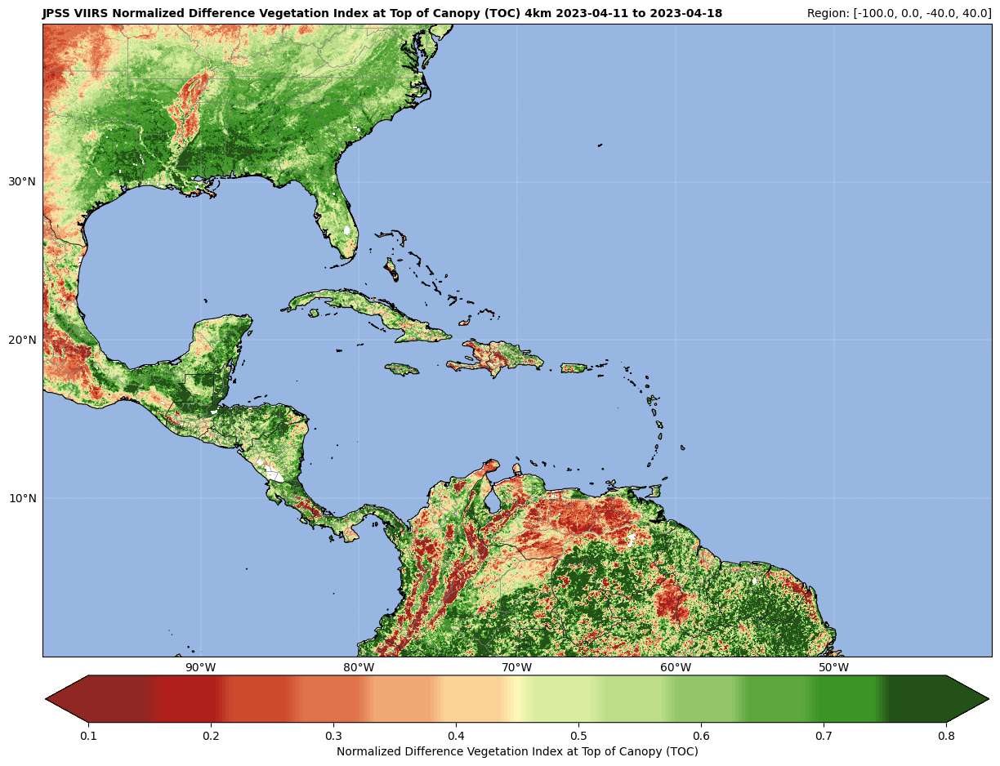

In [ ]:
#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
colors = ["#8f2723", "#8f2723", "#8f2723", "#8f2723", "#af201b", "#af201b", "#af201b", "#af201b", "#ce4a2e", "#ce4a2e", "#ce4a2e", "#ce4a2e",
          "#df744a", "#df744a", "#df744a", "#df744a", "#f0a875", "#f0a875", "#f0a875", "#f0a875", "#fad398", "#fad398", "#fad398", "#fad398",
          "#fff8ba", "#d8eda0", "#d8eda0", "#d8eda0", "#d8eda0", "#bddd8a", "#bddd8a", "#bddd8a", "#bddd8a", "#93c669", "#93c669", "#93c669", 
          "#93c669", "#5da73e", "#5da73e", "#5da73e", "#5da73e", "#3c9427", "#3c9427", "#3c9427", "#3c9427", "#235117", "#235117", "#235117", 
          "#235117"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#235117')
cmap.set_under('#8f2723')
vmin = 0.1
vmax = 0.8

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.OCEAN)

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Normalized Difference Vegetation Index at Top of Canopy (TOC)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('JPSS VIIRS Normalized Difference Vegetation Index at Top of Canopy (TOC) 4km ' + date_formatted, fontweight='bold', fontsize=10, loc='left')
plt.title('Region: ' + str(extent), fontsize=10, loc='right')
#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

#**Demonstration 9: Blended Total Ozone Analysis - TOAST**

**GEONETCast-Americas Directory: JPSS/PRODUCTS/TOAST/**

In this example, we'll see how to process the Blended Total Ozone GRIBs uploaded by NOAA, step by step.

## **Ex.9 (TOAST) Step 1: Importing Required Libraries and Making a Basic Plot**



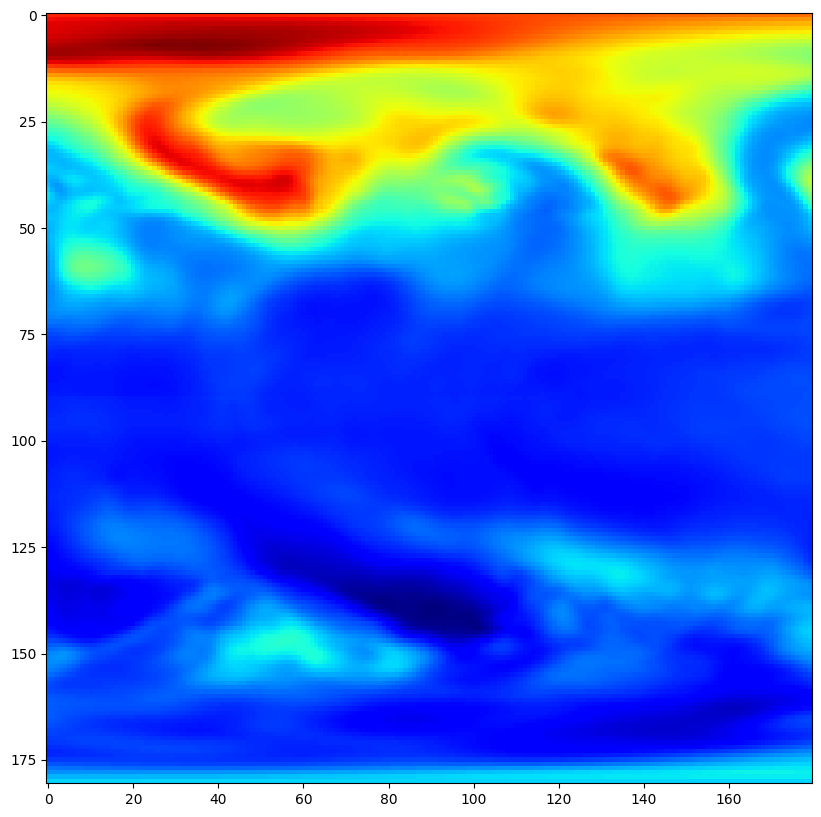

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: TOAST - GRIB
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
import pygrib                               # Provides a high-level interface to the ECWMF ECCODES C library for reading GRIB files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Open the file using the PyGRIB library
name = "TOAST_Blended-grb_j01_CRIN_j01_OMPS_20230418.grb"
grib = pygrib.open(name)

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-180.0, -90.0, 180.0, 90.0] 

# Extract the TOAST
toast = grib.select(name='Total column ozone')[0]
toast, lats, lons = toast.data(lat1=extent[1],lat2=extent[3],lon1=e xtent[0]+360,lon2=extent[2]+360)
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))
 
# Plot the image
plt.imshow(toast, origin='upper', cmap='jet')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

## **Ex.9 (TOAST) Step 2: Retrieving the Time and Date**



In [ ]:
#------------------------------------------------------------------------------------------------------

# Getting the file time and date
date = name[name.find("OMPS_")+5:name.find(".grb")]
year = date[0:4]
month = date[4:6]
day = date[6:8]
date_formatted = year + '-' + month + '-' + day

# Print the formatted time and date
print("TOAST File Date: ", date_formatted)

#------------------------------------------------------------------------------------------------------

TOAST File Date:  2023-04-18


## **Ex.9 (TOAST) Step 3: Final Plot**



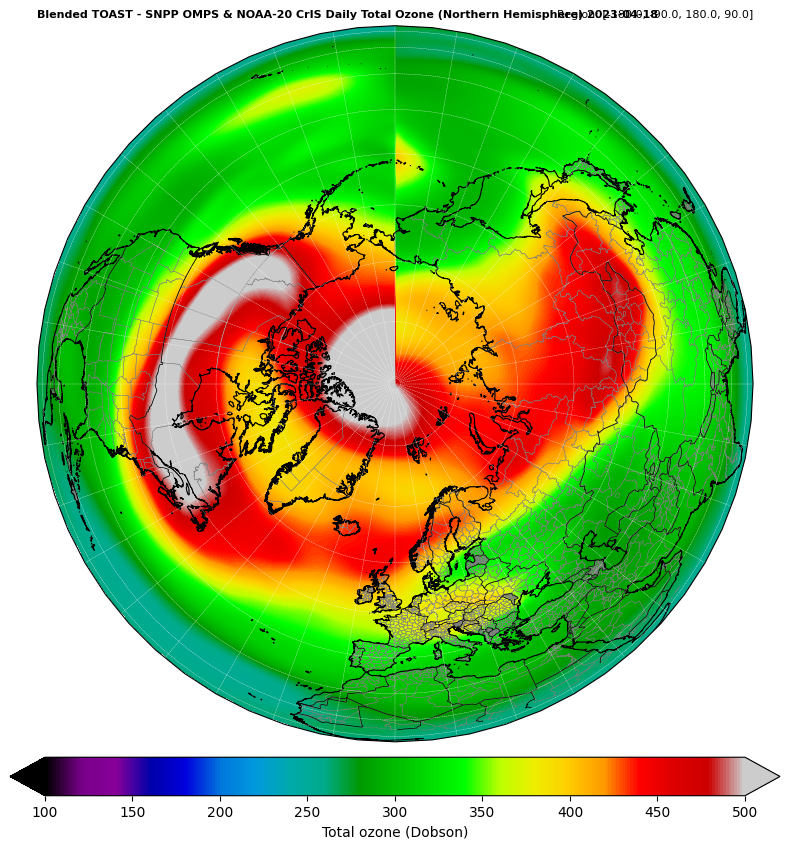

In [ ]:
# To smooth the data
import scipy.ndimage
toast = scipy.ndimage.zoom(toast, 3)
lats = scipy.ndimage.zoom(lats, 3)
lons = scipy.ndimage.zoom(lons, 3)

#------------------------------------------------------------------------------------------------------
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Use the Mercator projection in cartopy
ax = plt.axes(projection=ccrs.Orthographic(0, 90))

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Create a custom color scale:
cmap = "nipy_spectral"
vmin = 100
vmax = 500

# Plot the image
img = ax.imshow(toast, vmin=vmin, vmax=vmax, origin='upper', extent=img_extent, transform=ccrs.PlateCarree(), cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=False)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Total ozone (Dobson)', extend='both', orientation='horizontal', pad=0.02, fraction=0.05)

# Add a title
plt.title('Blended TOAST - SNPP OMPS & NOAA-20 CrIS Daily Total Ozone (Northern Hemisphere) ' + date_formatted, fontweight='bold', fontsize=8, loc='left')
plt.title('Region: ' + str(extent), fontsize=8, loc='right')
#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

#**Demonstration 10: Multimission Fires / Hotspots**

**GEONETCast-Americas Directory: /INPE**

In this example, we'll see how to process the Global Multimission Fire / Hotspots Shapefiles uploaded by INPE.

Fire / Hotspots File Date:  2023-04-19


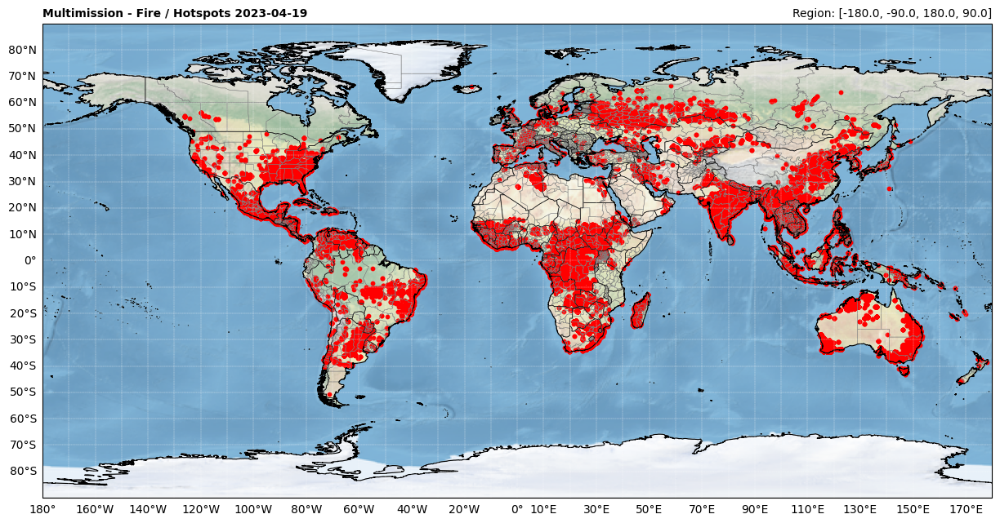

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Training - Processing General GNC-A Products With Python - Demonstration: Fire / Hotspots Shapefile
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import cartopy.feature as cfeature          # Common drawing and filtering operations
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Plate Carree projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-180.0, -90.00, 180.00, 90.00]
ax.set_extent([extent[0], extent[2], extent[1], extent[3]])

# Add a background map
ax.stock_img()

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Reading the fire / hotspots
name = 'INPE_MVF_202304190000.shp'
points = list(cartopy.io.shapereader.Reader(name).geometries())
ax.scatter([point.x for point in points],
           [point.y for point in points],
           transform=ccrs.Geodetic(), s=10, color='red')

# Getting the file time and date
date = (name[name.find("MVF_")+4:name.find(".shp")])
date_formatted = date[0:4] + '-' + date[4:6] + '-' + date[6:8] 

# Print the formatted time and date
print("Fire / Hotspots File Date: ", date_formatted)

# Add a title
plt.title('Multimission - Fire / Hotspots ' + date_formatted, fontweight='bold', fontsize=10, loc='left')
plt.title('Region: ' + str(extent), fontsize=10, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

Fire / Hotspots File Date:  2023-04-19


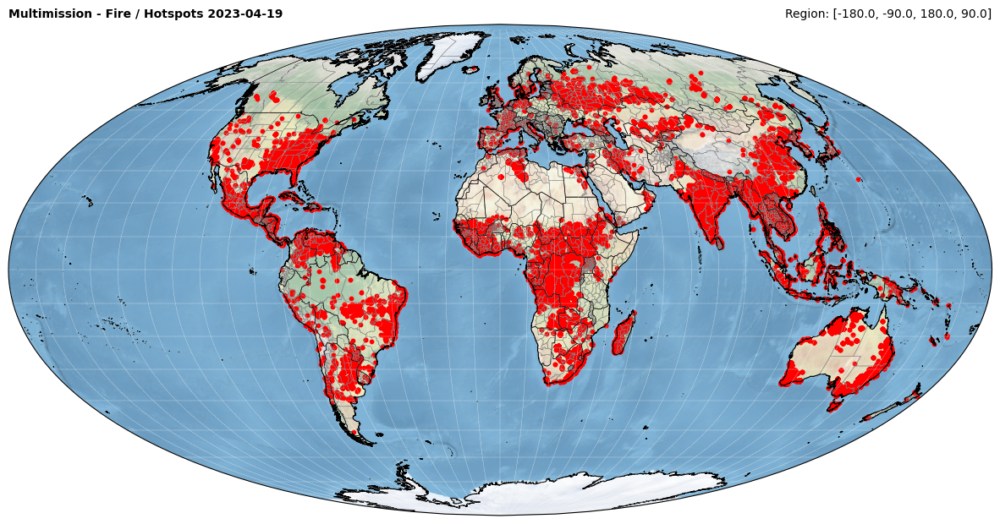

In [ ]:
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Mollweide projection in cartopy
ax = plt.axes(projection=ccrs.Mollweide(central_longitude=0.0))

# Method used for "global" plots
ax.set_global()

# Add a background map
ax.stock_img()

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=False)

# Reading the fire hotspots
name = 'INPE_MVF_202304190000.shp'
points = list(cartopy.io.shapereader.Reader(name).geometries())
ax.scatter([point.x for point in points],
           [point.y for point in points],
           transform=ccrs.Geodetic(), s=10, color='red')

# Getting the file time and date
date = (name[name.find("MVF_")+4:name.find(".shp")])
date_formatted = date[0:4] + '-' + date[4:6] + '-' + date[6:8] 

# Print the formatted time and date
print("Fire / Hotspots File Date: ", date_formatted)

# Add a title
plt.title('Multimission - Fire / Hotspots ' + date_formatted, fontweight='bold', fontsize=10, loc='left')
plt.title('Region: ' + str(extent), fontsize=10, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

Fire / Hotspots File Date:  2023-04-19


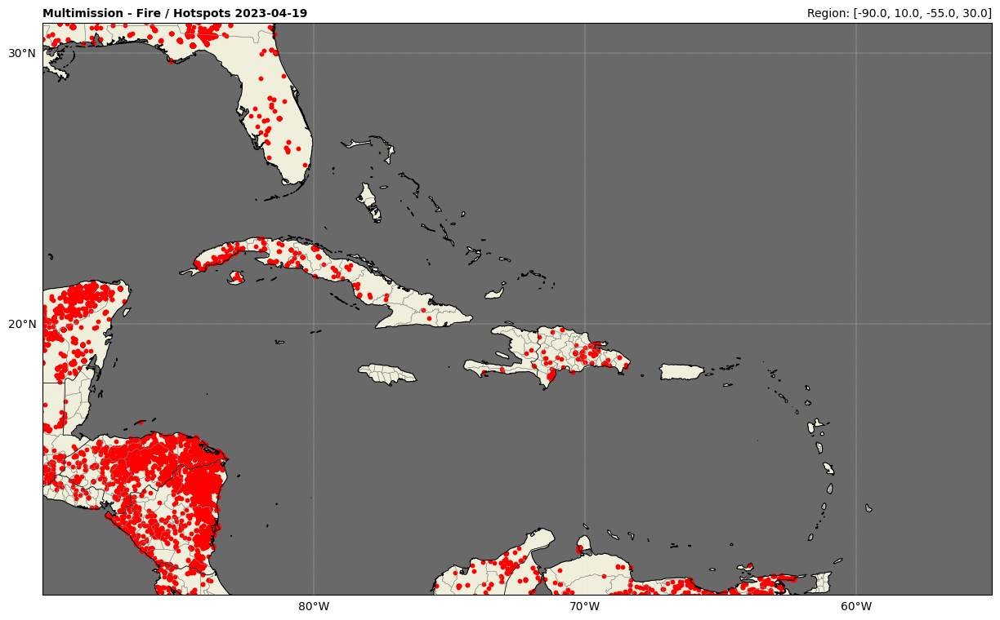

In [ ]:
#------------------------------------------------------------------------------------------------------

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# Use the Plate Carree projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Select the extent [min. lon, min. lat, max. lon, max. lat]
extent = [-90.0, 10.00, -55.00, 30.00]
ax.set_extent([extent[0], extent[2], extent[1], extent[3]])

# Add some various map elements to the plot to make it recognizable.
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.OCEAN, facecolor='dimgrey')

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 10), ylocs=np.arange(-90, 90, 10), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Reading the fire hotspots
name = 'INPE_MVF_202304190000.shp'
points = list(cartopy.io.shapereader.Reader(name).geometries())
ax.scatter([point.x for point in points],
           [point.y for point in points],
           transform=ccrs.Geodetic(), s=10, color='red')

# Getting the file time and date
date = (name[name.find("MVF_")+4:name.find(".shp")])
date_formatted = date[0:4] + '-' + date[4:6] + '-' + date[6:8] 

# Print the formatted time and date
print("Fire / Hotspots File Date: ", date_formatted)

# Add a title
plt.title('Multimission - Fire / Hotspots ' + date_formatted, fontweight='bold', fontsize=10, loc='left')
plt.title('Region: ' + str(extent), fontsize=10, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

### **Contact:** Diego Souza - INPE / CGCT / DISSM - (diego.souza@inpe.br)

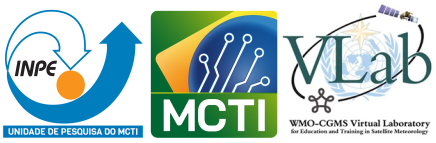